<a href="https://colab.research.google.com/github/olesjaeidelman/Unit2-Assignment/blob/main/Unit3_Project3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Unit3: Data Analytics in Python - Project 3
*   Visit the NYPD Open Data and load dataset for analysis
*   https://data.cityofnewyork.us/Public-Safety/NYPD-Arrest-Data-Year-to-Date-/uip8-fykc


Create a descriptive analysis of data within the dataset.

For this dataset, you will need to use:
*   Data wrangling and cleaning
*   Renaming variables
*   Filtering data
*   Data aggregation
*   Data Visualization techniques
*   Descriptive statistics 
*   Detailed descriptions of everything in your dataset

# Data Exploration

In [1]:
#Import all libraries that will be used for analysis
import pandas as pd
import matplotlib as plt
import numpy as np
import seaborn as sns
%matplotlib inline

In [2]:
#Get current working directory, the easiest place to copy the file to for import 
import os
os.getcwdb()

b'/content'

In [7]:
#Import the dataset that will be used for analysis
df = pd.read_csv('/content/NYPD_Arrest_Data__Year_to_Date_.csv')

In [8]:
#Review first 5 rows of the dataset
df.head()

,ARREST_KEY,ARREST_DATE,PD_CD,PD_DESC,KY_CD,OFNS_DESC,LAW_CODE,LAW_CAT_CD,ARREST_BORO,ARREST_PRECINCT,JURISDICTION_CODE,AGE_GROUP,PERP_SEX,PERP_RACE,X_COORD_CD,Y_COORD_CD,Latitude,Longitude,New Georeferenced Column
0,238013474,12/18/2021,157.0,RAPE 1,104.0,RAPE,PL 1303501,F,Q,105,97,18-24,M,BLACK,1057636,203954,40.726187,-73.735234,POINT (-73.73523390399998 40.72618713000002)
1,236943583,11/25/2021,263.0,"ARSON 2,3,4",114.0,ARSON,PL 1501500,F,K,69,71,25-44,M,BLACK,1014340,171320,40.636868,-73.891586,POINT (-73.89158591899997 40.63686750900007)
2,234938876,10/14/2021,594.0,OBSCENITY 1,116.0,SEX CRIMES,PL 2631100,F,K,61,0,25-44,M,WHITE,995244,155739,40.594145,-73.960415,POINT (-73.96041495199995 40.59414516900005)
3,234788259,10/11/2021,263.0,"ARSON 2,3,4",114.0,ARSON,PL 1501001,F,B,42,71,18-24,M,BLACK,1009058,239616,40.824340,-73.910365,POINT (-73.91036538099996 40.82433953100008)
4,234188790,09/28/2021,578.0,NaN,NaN,NaN,PL 2223001,M,B,44,0,25-44,M,BLACK,1005169,246667,40.843703,-73.924395,POINT (-73.92439508899997 40.84370255600004)


In [9]:
#This dataset has 155,507 rows and 19 columns
df.shape

(155507, 19)

In [10]:
#Find out how much duplication we have in this file. There are no records that are entirely duplicated
df[df.duplicated(keep=False)]

,ARREST_KEY,ARREST_DATE,PD_CD,PD_DESC,KY_CD,OFNS_DESC,LAW_CODE,LAW_CAT_CD,ARREST_BORO,ARREST_PRECINCT,JURISDICTION_CODE,AGE_GROUP,PERP_SEX,PERP_RACE,X_COORD_CD,Y_COORD_CD,Latitude,Longitude,New Georeferenced Column


In [11]:
#How many years worth of data are included here? Looks like only one year worth of data
df.groupby(['ARREST_DATE'])['ARREST_KEY'].count().sort_values(ascending = False)

ARREST_DATE
09/21/2021    701
10/13/2021    683
11/17/2021    649
10/06/2021    640
01/06/2021    634
             ... 
04/26/2021    230
12/24/2021    212
11/25/2021    194
12/25/2021    181
02/01/2021    139
Name: ARREST_KEY, Length: 365, dtype: int64

In [12]:
#Show counts by offence description, PD description. PD Description is more specific. Show top 20 rows
df.groupby(['OFNS_DESC','PD_DESC'])['ARREST_KEY'].count().sort_values(ascending = False).head(20)

OFNS_DESC                       PD_DESC                                  
ASSAULT 3 & RELATED OFFENSES    ASSAULT 3                                    19766
PETIT LARCENY                   LARCENY,PETIT FROM OPEN AREAS,               13143
FELONY ASSAULT                  ASSAULT 2,1,UNCLASSIFIED                     11663
ROBBERY                         ROBBERY,OPEN AREA UNCLASSIFIED                7809
MISCELLANEOUS PENAL LAW         PUBLIC ADMINISTRATION,UNCLASSI                7135
GRAND LARCENY                   LARCENY,GRAND FROM OPEN AREAS, UNATTENDED     5772
VEHICLE AND TRAFFIC LAWS        TRAFFIC,UNCLASSIFIED MISDEMEAN                4908
DANGEROUS DRUGS                 CONTROLLED SUBSTANCE, POSSESSI                4569
DANGEROUS WEAPONS               WEAPONS POSSESSION 1 & 2                      4559
BURGLARY                        BURGLARY,UNCLASSIFIED,UNKNOWN                 4453
ASSAULT 3 & RELATED OFFENSES    MENACING,UNCLASSIFIED                         4436
OFFENSES INVO

In [15]:
#Show counts by borough, adding borough description if used
df.groupby(['ARREST_BORO'])['ARREST_KEY'].count().sort_values(ascending = False)

ARREST_BORO
K    41550
M    39677
B    34018
Q    33051
S     7211
Name: ARREST_KEY, dtype: int64

In [16]:
#Show counts by age group
df.groupby(['AGE_GROUP'])['ARREST_KEY'].count().sort_values(ascending = False)

AGE_GROUP
25-44    88850
45-64    30608
18-24    28951
<18       4800
65+       2298
Name: ARREST_KEY, dtype: int64

In [17]:
#Show counts by race
df.groupby(['PERP_RACE'])['ARREST_KEY'].count().sort_values(ascending = False)

PERP_RACE
BLACK                             77133
WHITE HISPANIC                    38112
WHITE                             17063
BLACK HISPANIC                    13576
ASIAN / PACIFIC ISLANDER           8593
UNKNOWN                             587
AMERICAN INDIAN/ALASKAN NATIVE      443
Name: ARREST_KEY, dtype: int64

In [18]:
#Show counts by sex
df.groupby(['PERP_SEX'])['ARREST_KEY'].count().sort_values(ascending = False)

PERP_SEX
M    128910
F     26597
Name: ARREST_KEY, dtype: int64

# Data Preparation

In [19]:
#Show all columns in the data frame
df.columns

Index(['ARREST_KEY', 'ARREST_DATE', 'PD_CD', 'PD_DESC', 'KY_CD', 'OFNS_DESC',
       'LAW_CODE', 'LAW_CAT_CD', 'ARREST_BORO', 'ARREST_PRECINCT',
       'JURISDICTION_CODE', 'AGE_GROUP', 'PERP_SEX', 'PERP_RACE', 'X_COORD_CD',
       'Y_COORD_CD', 'Latitude', 'Longitude', 'New Georeferenced Column'],
      dtype='object')

In [20]:
#I am going to focus only on some fields, and keep arrest key, date, PD description, offence description, borough, age group, sex, race and latitude/longitude
#Remove columns that I will not be using, so dataset is more manageable:
drop_cols = ['PD_CD','KY_CD','LAW_CODE', 'LAW_CAT_CD', 'ARREST_PRECINCT','JURISDICTION_CODE', 'X_COORD_CD', 'Y_COORD_CD', 'New Georeferenced Column']
df.drop(drop_cols, inplace = True, axis = 1)

In [21]:
#Check updated layout
df.head(20)

,ARREST_KEY,ARREST_DATE,PD_DESC,OFNS_DESC,ARREST_BORO,AGE_GROUP,PERP_SEX,PERP_RACE,Latitude,Longitude
0,238013474,12/18/2021,RAPE 1,RAPE,Q,18-24,M,BLACK,40.726187,-73.735234
1,236943583,11/25/2021,"ARSON 2,3,4",ARSON,K,25-44,M,BLACK,40.636868,-73.891586
2,234938876,10/14/2021,OBSCENITY 1,SEX CRIMES,K,25-44,M,WHITE,40.594145,-73.960415
3,234788259,10/11/2021,"ARSON 2,3,4",ARSON,B,18-24,M,BLACK,40.824340,-73.910365
4,234188790,09/28/2021,NaN,NaN,B,25-44,M,BLACK,40.843703,-73.924395
5,234117071,09/27/2021,RAPE 1,RAPE,K,25-44,M,BLACK,40.695469,-73.982825
6,233755503,09/18/2021,NaN,NaN,Q,18-24,M,WHITE HISPANIC,40.682398,-73.840072
7,233740512,09/18/2021,RAPE 1,RAPE,B,25-44,M,WHITE HISPANIC,40.816392,-73.895296
8,233697123,09/17/2021,RAPE 1,RAPE,Q,25-44,M,BLACK,40.726187,-73.735234
9,233381184,09/10/2021,NaN,NaN,Q,25-44,M,BLACK,40.772852,-73.927443


In [22]:
#Create new column with arrest month name
df['ARREST_MO'] = pd.DatetimeIndex(df['ARREST_DATE']).month_name()

In [23]:
#Create new column with arrest month number
df['ARREST_MO_NBR'] = pd.DatetimeIndex(df['ARREST_DATE']).month

In [24]:
#Show counts by month. Our dataset contains 2021 data
df.groupby(['ARREST_MO'])['ARREST_KEY'].count().sort_values(ascending = False)

ARREST_MO
October      14453
March        13980
September    13756
August       13745
July         13561
January      13506
November     13068
June         12850
December     12689
May          11822
February     11653
April        10424
Name: ARREST_KEY, dtype: int64

In [25]:
#Create new column with arrest year
df['ARREST_YR'] = pd.DatetimeIndex(df['ARREST_DATE']).year

In [26]:
#Show counts by year. Our dataset contains 2021 data
df.groupby(['ARREST_YR'])['ARREST_KEY'].count().sort_values(ascending = False)

ARREST_YR
2021    155507
Name: ARREST_KEY, dtype: int64

In [27]:
#Create new column with borough names. B(Bronx), S(Staten Island), K(Brooklyn), M(Manhattan), Q(Queens)
boroughs = [
    (df['ARREST_BORO'] == 'B'),
    (df['ARREST_BORO'] == 'S'),
    (df['ARREST_BORO'] == 'K'),
    (df['ARREST_BORO'] == 'M'),
    (df['ARREST_BORO'] == 'Q')
    ]

#Create a list of the names we want to assign for each borough code
names = ['Bronx', 'Staten Island', 'Brooklyn', 'Manhattan', 'Queens']

#Create a new column and use np.select to assign names to it using our lists as arguments
df['BORO_NAME'] = np.select(boroughs, names)

#Display updated DataFrame to confirm all column editions
df.head()

,ARREST_KEY,ARREST_DATE,PD_DESC,OFNS_DESC,ARREST_BORO,AGE_GROUP,PERP_SEX,PERP_RACE,Latitude,Longitude,ARREST_MO,ARREST_MO_NBR,ARREST_YR,BORO_NAME
0,238013474,12/18/2021,RAPE 1,RAPE,Q,18-24,M,BLACK,40.726187,-73.735234,December,12,2021,Queens
1,236943583,11/25/2021,"ARSON 2,3,4",ARSON,K,25-44,M,BLACK,40.636868,-73.891586,November,11,2021,Brooklyn
2,234938876,10/14/2021,OBSCENITY 1,SEX CRIMES,K,25-44,M,WHITE,40.594145,-73.960415,October,10,2021,Brooklyn
3,234788259,10/11/2021,"ARSON 2,3,4",ARSON,B,18-24,M,BLACK,40.824340,-73.910365,October,10,2021,Bronx
4,234188790,09/28/2021,NaN,NaN,B,25-44,M,BLACK,40.843703,-73.924395,September,9,2021,Bronx


# Data Analysis



---


*I am going to start my analysis with review of monthly crime rates for each borough. I will use pivot table, line chart and box plot to illustrate crime rate trends.*

In [28]:
#Create a pivot table that illustrates how monthly crime counts change for each borough
#I am using both month number and month name, so that months are shown in correct order on the chart below
df_monthly = df.pivot_table(
      values='ARREST_KEY', index=('ARREST_MO_NBR', 'ARREST_MO'), columns='BORO_NAME',
      fill_value=0, aggfunc='count')
#Highlight largest values for each borough 
df_monthly.style.highlight_max(color = 'pink', axis = 0).highlight_min(color = 'lightgreen', axis = 0)

,BORO_NAME,Bronx,Brooklyn,Manhattan,Queens,Staten Island
ARREST_MO_NBR,ARREST_MO,,,,,
1,January,3201,3783,3174,2710,638
2,February,2589,3243,2767,2505,549
3,March,3051,3720,3528,2993,688
4,April,2097,2728,2715,2398,486
5,May,2398,3312,3025,2542,545
6,June,2691,3497,3255,2781,626
7,July,3158,3618,3299,2862,624
8,August,2882,3620,3617,3019,607
9,September,3243,3483,3568,2844,618


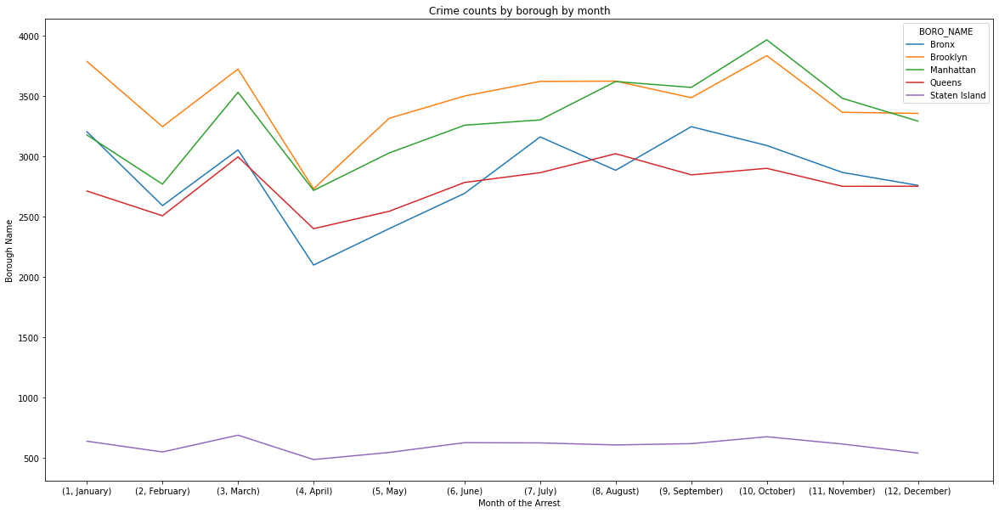

In [29]:
#This line chart illustrates monthly trends for each borough
#I added tick marks range for x axis to make sure every month is shown instead of the default display
df_monthly.plot.line(figsize = (20, 10), xticks=np.arange(0,13,1), xlabel = "Month of the Arrest", ylabel = "Borough Name", grid = False, title = "Crime counts by borough by month")

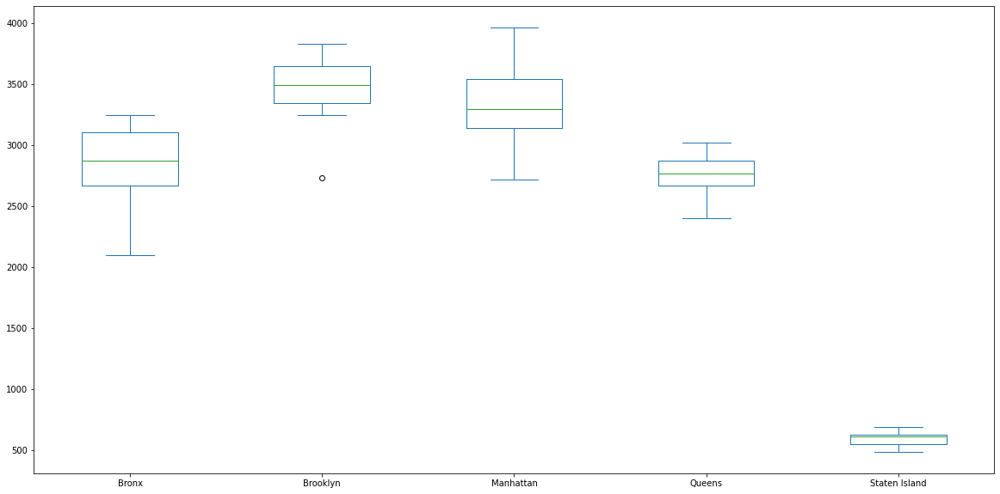

In [30]:
#Use boxplot to show overall trend and spread of monthly crime rates for each borough. 
df_monthly.plot.box(figsize = (20, 10))

**Question #1: How do crime rates change throughout the year? What is the highest and the lowest crime rate month for each borough?**

The pivot table and the line chart above illustrate similar trend in crime volume for all broughs. Highest crime rates are in September for the Bronx, October for both Brooklyn and Manhattan, August for Queens and March for Staten Island. The lowest crime rate is in April for all boroughs.

Boxplot above shows monthly averages and maximum/minimum ranges for each borough. Even though Manhattan had the largest crime rate in the month of October, Brooklyn has the highest average crime rates across all boroughs. Boxplot also highlights an outlier value for Brooklyn; this value corresponds to 2728 in April and is unusually low month for Brooklyn.



---


*Second, I would like to review daily crime rate trends across all five boroughs and find chart type that illustrates daily changes the best.* 

In [31]:
#Create a pivot table that illustrates how daily crime counts change for each borough
#I am using both month number and month name, so that months are shown in correct order on the chart below
df_daily = df.pivot_table(
      values='ARREST_KEY', index=('ARREST_DATE'), columns='BORO_NAME',
      fill_value=0, aggfunc='count')
#Highlight largest values for each borough 
df_daily.style.highlight_max(color = 'pink', axis = 0).highlight_min(color = 'lightgreen', axis = 0)

BORO_NAME,Bronx,Brooklyn,Manhattan,Queens,Staten Island
ARREST_DATE,,,,,
01/01/2021,103,146,64,110,19
01/02/2021,92,118,88,70,18
01/03/2021,77,107,70,46,7
01/04/2021,105,82,80,75,17
01/05/2021,169,152,133,115,23
01/06/2021,158,156,169,112,39
01/07/2021,141,141,117,110,24
01/08/2021,88,162,113,111,21
01/09/2021,109,92,64,74,11


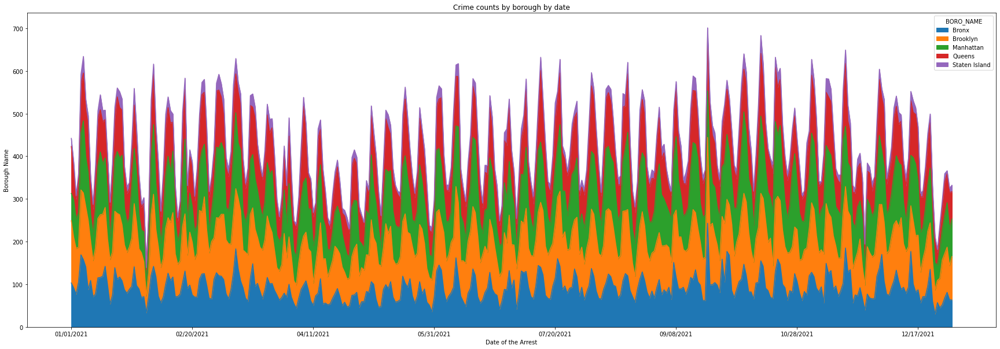

In [35]:
#Create plot chart that shows daily trends, compare stacked vs. unstacked settings
df_daily.plot.area(figsize = (30, 10), xlabel = "Date of the Arrest", ylabel = "Borough Name", stacked = True, title = "Crime counts by borough by date")

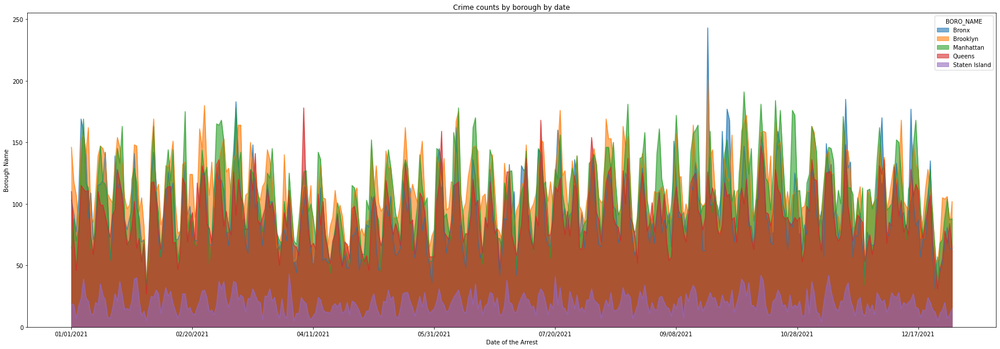

In [36]:
#Use unstacked plot to show daily trends for comparison.
df_daily.plot.area(figsize = (30, 10), xlabel = "Date of the Arrest", ylabel = "Borough Name", stacked = False, title = "Crime counts by borough by date", alpha = .6)
#Alpha allows adjusting color transparency.

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7fc1c7203510>,
      dtype=object)

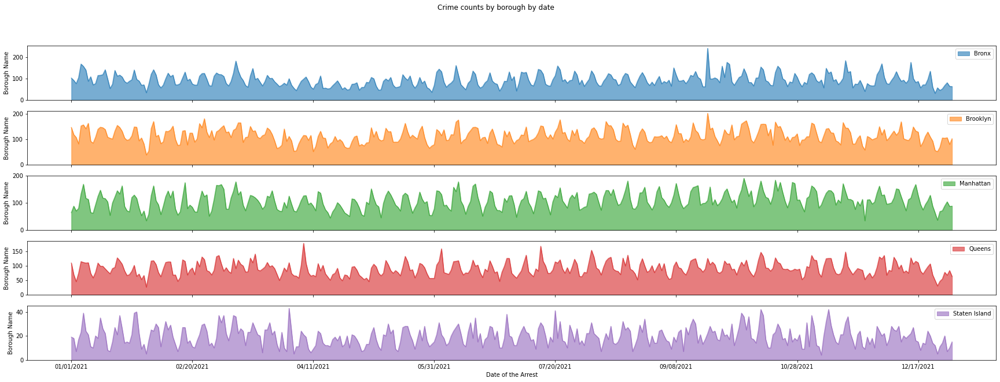

In [37]:
#Subplots is a great feature and generates daily plots for each borough; could be helpful when trying to look for borough-specific trends.
df_daily.plot.area(figsize = (30, 10), xlabel = "Date of the Arrest", ylabel = "Borough Name", stacked = False, title = "Crime counts by borough by date", alpha = .6, subplots = True)

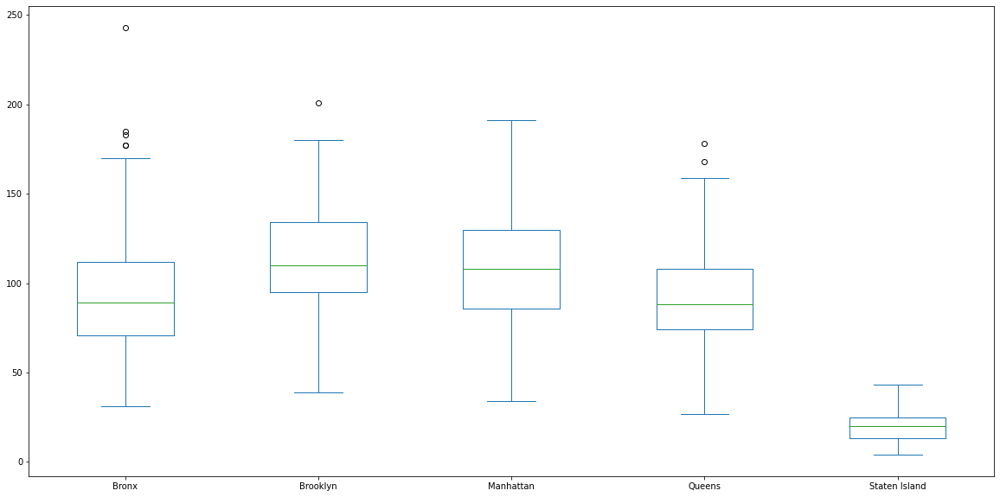

In [38]:
#Since we are working with daily counts, subplot will show daily statistics and averages for each borough.
df_daily.plot.box(figsize = (20, 10))

**Question #2: What is the best chart to illustrate daily crime rates?**

Although pivot table clearly shows crime rates for each borough, it takes quite a bit of scrolling to review counts/trends. Highlighting of maximum/minimum values for the pivot is a great feature, and allows quickly to identify days with the highest and lowest crime rates for each borough. 

The stacked area plot is very colorful, and takes a bit of time to understand.
Two colors that are the most visible are green and orange that correspond to Manhattan and Brooklyn, boroughs with the highest crime rates, followed by the Bronx and Queens. Staten Island has the lowest crime rates. I think this chart is the best when used for overall trend analysis for all 5 boroughs. It could also help to focus on specific time period at a time, like a quarter.

Unstacked area plot is better for daily volume analysis. It illustrates well the highest and the lowest points. We can see that the highest daily crime rate was in the Bronx sometime around mid-September. 

I like boxplot chart the most, it seems to be very clean and uncluttered. It illustrates really well averages, minimum/maximum vaues, and outliers. As shown on charts mentioned above, the highest daily crime rate was for the Bronx and totaled nearly 250 cases. The lowest daily crime rate was in Staten Island and near zero. 

In summary, using combination of all charts is the best option. Area plot allows visually see daily highs/lows and illustrates well when they happen; boxplot shows volume, averages and outliers. And pivot table allows looking up exact daily volumes to complete the narrative. 



---


*Next, I would like to review crime rates by gender, sex and ethnicity and 
practice using pie charts to illustrate the differences.*

In [39]:
#Find out which age group has the largest crime rates with totals (see margin parameter)
#Pivot allows quick counts review by gender, race and age group.
df_age = df.pivot_table(values='ARREST_KEY', index=('PERP_SEX', 'PERP_RACE'),  columns= 'AGE_GROUP',fill_value=0, aggfunc='count', margins = True)
df_age

AGE_GROUP                                18-24  25-44  ...   <18     All
PERP_SEX PERP_RACE                                     ...              
F        AMERICAN INDIAN/ALASKAN NATIVE     19     37  ...     1      67
         ASIAN / PACIFIC ISLANDER          199    798  ...    26    1420
         BLACK                            2845   7574  ...   510   13407
         BLACK HISPANIC                    404   1131  ...    76    1920
         UNKNOWN                            13     63  ...     0      86
         WHITE                             420   2004  ...    30    3197
         WHITE HISPANIC                   1340   3948  ...   202    6500
M        AMERICAN INDIAN/ALASKAN NATIVE     80    220  ...     6     376
         ASIAN / PACIFIC ISLANDER         1168   4086  ...   112    7173
         BLACK                           12571  35011  ...  2480   63726
         BLACK HISPANIC                   2636   6759  ...   475   11656
         UNKNOWN                            94    294  ...    18     501
         WHITE                            1368   8079  ...   155   13866
         WHITE HISPANIC                   5794  18846  ...   709   31612
All                                      28951  88850  ...  4800  155507

[15 rows x 6 columns]

In [40]:
#Pivot table with crime rates by race.
df_race = df.pivot_table(values='ARREST_KEY', index=('PERP_RACE'),  fill_value=0, aggfunc='count', margins = False)
df_race

,ARREST_KEY
PERP_RACE,
AMERICAN INDIAN/ALASKAN NATIVE,443
ASIAN / PACIFIC ISLANDER,8593
BLACK,77133
BLACK HISPANIC,13576
UNKNOWN,587
WHITE,17063
WHITE HISPANIC,38112


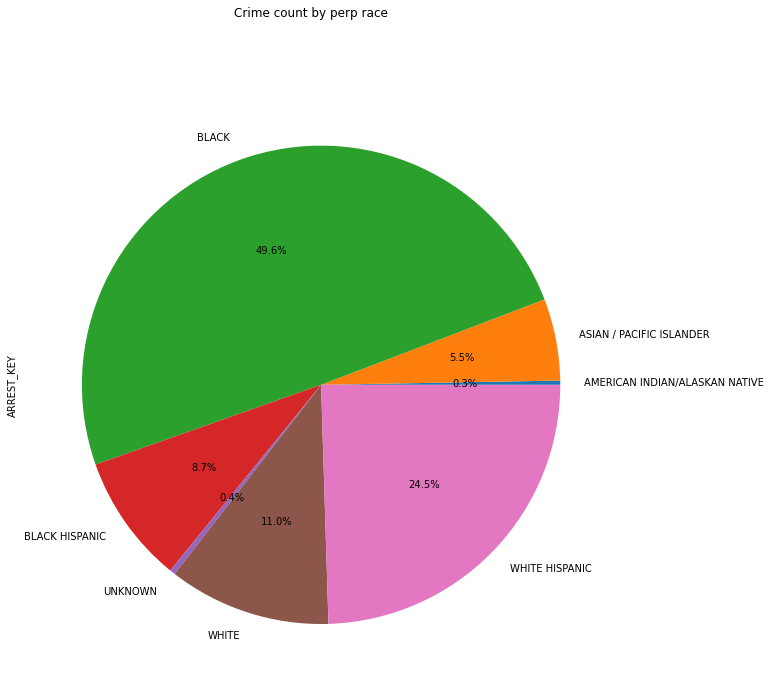

In [41]:
#Use pie chart to illustrate count breakdown by race. We can see the crime rate is the largest among black populatio, followed by white hispanic and white.
#The lowest crime rate is for american indian/alaskan native race.
plot = df_race.plot.pie(subplots=True, figsize=(11, 11), title = "Crime count by perp race", autopct='%1.1f%%', legend=False)

In [43]:
#Show crime rate comparison by race, by gender. Are there differences in crime rates between genders?
df_racesex = df.pivot_table(values='ARREST_KEY', index=('PERP_RACE'),  columns= 'PERP_SEX',fill_value=0, aggfunc='count', margins = False)
df_racesex

PERP_SEX,F,M
PERP_RACE,,
AMERICAN INDIAN/ALASKAN NATIVE,67,376
ASIAN / PACIFIC ISLANDER,1420,7173
BLACK,13407,63726
BLACK HISPANIC,1920,11656
UNKNOWN,86,501
WHITE,3197,13866
WHITE HISPANIC,6500,31612


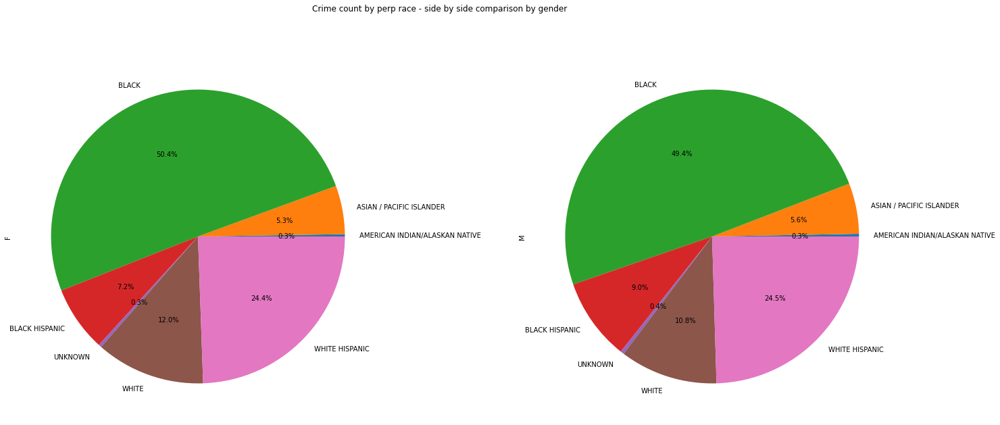

In [44]:
#I am going to use pie chart subplot to illustrate count breakdown by race and gender.
#Race breakdown percentages is very similar for both genders. Interesting to note that white female crime percentage is higher than white males by 1.2%
plot = df_racesex.plot.pie(subplots=True, figsize=(25, 10), title = "Crime count by perp race - side by side comparison by gender", autopct='%1.1f%%', legend=False)

In [45]:
#Show crime rate comparison by age, by gender.
df_agesex = df.pivot_table(values='ARREST_KEY', index=('AGE_GROUP'),  columns= 'PERP_SEX',fill_value=0, aggfunc='count', margins = False)
df_agesex

PERP_SEX,F,M
AGE_GROUP,,
18-24,5240,23711
25-44,15555,73295
45-64,4631,25977
65+,326,1972
<18,845,3955


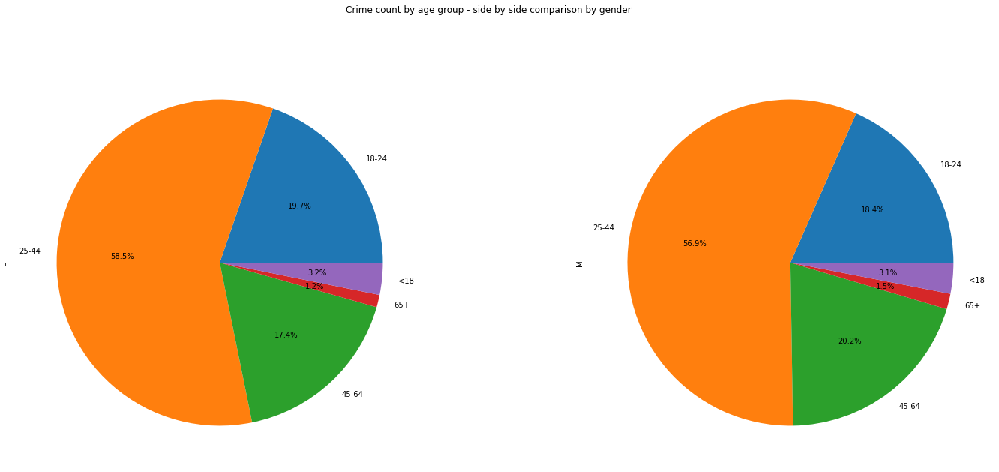

In [46]:
#Pie plot below shows side by side comparison by gender by age category. It confirms that age group between 25-44 has the largest crime rates regardless of the gender.
#Second largest crime rate is for age 18-24 for females and 45-66 for males.
plot = df_agesex.plot.pie(subplots=True, figsize=(25, 10), title = "Crime count by age group - side by side comparison by gender", autopct='%1.1f%%', legend=False)

In [48]:
#This is the same pivot table is above, but I am not showing totals, so that heatmap chart below will not get totals as a part of visual.
df_all = df.pivot_table(values='ARREST_KEY', index=('PERP_SEX', 'PERP_RACE'),  columns= 'AGE_GROUP',fill_value=0, aggfunc='count', margins = False)
df_all

AGE_GROUP                                18-24  25-44  45-64  65+   <18
PERP_SEX PERP_RACE                                                     
F        AMERICAN INDIAN/ALASKAN NATIVE     19     37     10    0     1
         ASIAN / PACIFIC ISLANDER          199    798    353   44    26
         BLACK                            2845   7574   2364  114   510
         BLACK HISPANIC                    404   1131    295   14    76
         UNKNOWN                            13     63      9    1     0
         WHITE                             420   2004    665   78    30
         WHITE HISPANIC                   1340   3948    935   75   202
M        AMERICAN INDIAN/ALASKAN NATIVE     80    220     64    6     6
         ASIAN / PACIFIC ISLANDER         1168   4086   1618  189   112
         BLACK                           12571  35011  12807  857  2480
         BLACK HISPANIC                   2636   6759   1673  113   475
         UNKNOWN                            94    294     83   12    18
         WHITE                            1368   8079   3847  417   155
         WHITE HISPANIC                   5794  18846   5885  378   709

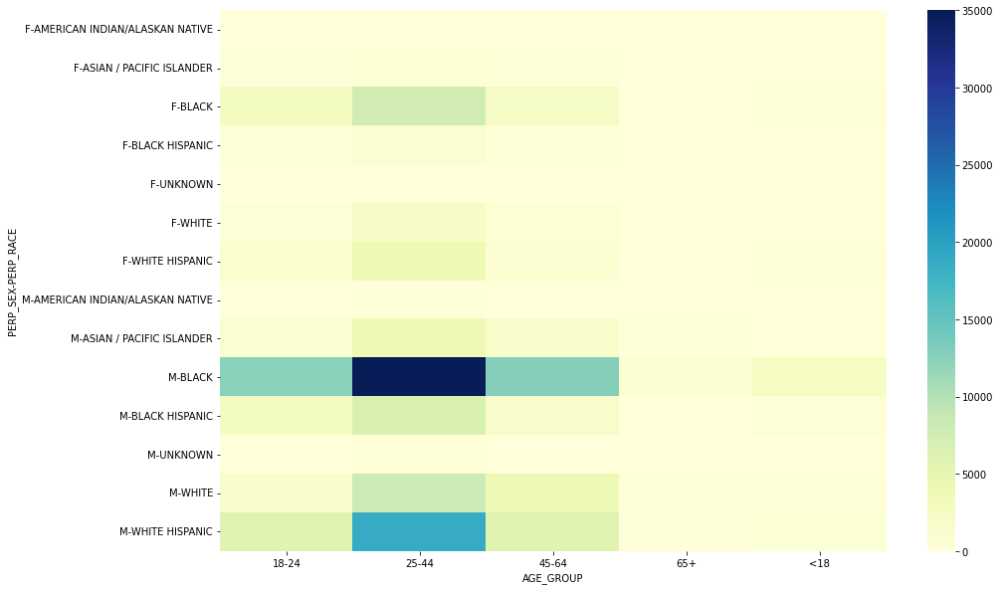

In [50]:
#I am using seaborn heatmap to show volume trends. As we can see, male black age of 25-44 have the largest crime rates, followed by white hispanic male age 25-44.

import matplotlib.pyplot as plt
# Initialize Figure and Axes object
fig, ax = plt.subplots(figsize=(15,10))

# Create heatmap  - shows counts concentration by race/gender and age group
sns.heatmap(df_all, cmap="YlGnBu", annot=False, cbar=True)

**Question #3: How do crime rates compare by race, gender and age group?**

The pie chart by race shows that the biggest crime number corresponds to black race (almost half of total crimes), followed by white hispanic (24.5%) and white (11%). The age group with the biggest crime rates is 25-44.

I used side by side pie charts to compare race counts between different genders.Interesting to note that there is very insignificant differences in race percentages between both genders.

Side by side pie chart by age group and gender show that age group 25-44 has the largest crime rates regardless of the gender. Second largest crime rate is for age 18-24 for females and 45-66 for males.

Lastly, I used heatmap to highlight largest counts by gender/race combination and age group. The heatmap confirms findings above - age group 25-44 black males have the largest crime rates, followed by male white hispanic age 25-44.



---

Finally, I was curious to check out if I can use longitude/latitude to show crime pins on the map. It is definitely a good feature to explore further.

# Using geo maps

In [52]:
# I wated to try this feature with a smaller dataset. I am getting the first 10000 crimes to the df_incidents dataframe. 
limit = 10000
df_incidents = df.iloc[0:limit, :]

In [53]:
df_incidents

,ARREST_KEY,ARREST_DATE,PD_DESC,OFNS_DESC,ARREST_BORO,AGE_GROUP,PERP_SEX,PERP_RACE,Latitude,Longitude,ARREST_MO,ARREST_MO_NBR,ARREST_YR,BORO_NAME
0,238013474,12/18/2021,RAPE 1,RAPE,Q,18-24,M,BLACK,40.726187,-73.735234,December,12,2021,Queens
1,236943583,11/25/2021,"ARSON 2,3,4",ARSON,K,25-44,M,BLACK,40.636868,-73.891586,November,11,2021,Brooklyn
2,234938876,10/14/2021,OBSCENITY 1,SEX CRIMES,K,25-44,M,WHITE,40.594145,-73.960415,October,10,2021,Brooklyn
3,234788259,10/11/2021,"ARSON 2,3,4",ARSON,B,18-24,M,BLACK,40.824340,-73.910365,October,10,2021,Bronx
4,234188790,09/28/2021,NaN,NaN,B,25-44,M,BLACK,40.843703,-73.924395,September,9,2021,Bronx
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,236691948,11/21/2021,"ROBBERY,OPEN AREA UNCLASSIFIED",ROBBERY,K,45-64,F,WHITE,40.657720,-73.982853,November,11,2021,Brooklyn
9996,237454093,12/07/2021,"ASSAULT 2,1,UNCLASSIFIED",FELONY ASSAULT,S,65+,M,WHITE HISPANIC,40.644982,-74.077321,December,12,2021,Staten Island
9997,236303102,11/15/2021,ASSAULT 3,ASSAULT 3 & RELATED OFFENSES,K,25-44,M,BLACK,40.657993,-74.000693,November,11,2021,Brooklyn
9998,236904521,11/24/2021,"INTOXICATED DRIVING,ALCOHOL",INTOXICATED & IMPAIRED DRIVING,K,25-44,M,WHITE HISPANIC,40.676296,-73.891698,November,11,2021,Brooklyn


In [54]:
#As I learned, Folium is a powerful Python library that helps you create several types of Leaflet maps. 
#Since Folium results are interactive, this library is very useful for dashboard building.
import folium
# New York latitude and longitude values
latitude = 40.72
longitude = -74.01
# create New York map and display it
ny_map = folium.Map(location=[latitude, longitude], zoom_start=10)
ny_map

In [55]:
#Create a feature group for the incidents in the dataframe
incidents = folium.map.FeatureGroup()
#loop through the crimes and add each to the incidents feature group
for lat, lng, in zip(df_incidents.Latitude, df_incidents.Longitude):
 incidents.add_child(
 folium.CircleMarker(
 [lat, lng],
 radius=5, 
 color="yellow",
 fill=True,
 fill_color="blue",
 fill_opacity=0.6
 )
)
# add incidents to map
ny_map.add_child(incidents)